In [1]:
include("../src/Granulars.jl")
using BenchmarkTools
using Plots

In [2]:
function YADE_move_q(q::Quaternion{Float64}, w::SVector{3, Float64}, dt::Float64)::Quaternion{Float64}
    q + dquat(q, w)*dt
end

function YADE_move_w(w::SVector{3, Float64}, τ::SVector{3, Float64}, II::SVector{3, Float64}, dt::Float64, cte=1.0::Float64, niter=3::Int64)::SVector{3, Float64}
    w + SVector(
            τ[1]/II[1] + w[2]*w[3]*(II[2]-II[3])/II[1],
            τ[2]/II[2] + w[3]*w[1]*(II[3]-II[1])/II[2],
            τ[3]/II[3] + w[1]*w[2]*(II[1]-II[2])/II[3])*dt*cte
end
function YADE_time_step(q,w,τ,II,dt)
    w = YADE_move_w(w,τ,II,dt)
    q = YADE_move_q(q,w,dt)
    q, w
end

YADE_time_step (generic function with 1 method)

In [3]:
function Omelyan_98_move_q(q::Quaternion{Float64}, w::SVector{3, Float64}, dt::Float64)::Quaternion{Float64}
    a1::Float64 = 1.0 - dt*dt*dot(w,w)/16.0
    a2::Float64 = 1.0 + dt*dt*dot(w,w)/16.0
    (a1*q + dquat(q, w)*dt)/a2
end

function Omelyan_98_move_w(w::SVector{3, Float64}, τ::SVector{3, Float64}, II::SVector{3, Float64}, dt::Float64, cte=1.0::Float64, niter=3::Int64)::SVector{3, Float64}
    ww::SVector{3, Float64} = w
    
    # Solve non-linear system
    for i in 1:niter
        ww = w + SVector(
            τ[1] + 0.5*(w[2]*w[3]+ww[2]*ww[3])*(II[2]-II[3]),
            τ[2] + 0.5*(w[3]*w[1]+ww[3]*ww[1])*(II[3]-II[1]),
            τ[3] + 0.5*(w[1]*w[2]+ww[1]*ww[2])*(II[1]-II[2]))*dt*cte./II
    end

    return ww
end
function Omelyan_98_time_step(q,w,τ,II,dt)
    w = Omelyan_98_move_w(w,τ,II,dt,0.5)
    q = Omelyan_98_move_q(q,w,dt)
    w = Omelyan_98_move_w(w,τ,II,dt,0.5)
    q, w
end

Omelyan_98_time_step (generic function with 1 method)

In [4]:
function Omelyan_99_move_q(q::Quaternion{Float64}, w::SVector{3, Float64}, dt::Float64)::Quaternion{Float64}
    a1::Float64 = 1.0 - dt*dt*dot(w,w)/16.0
    a2::Float64 = 1.0 + dt*dt*dot(w,w)/16.0
    (a1*q + dquat(q, w)*dt)/a2
end

function Omelyan_99_move_w(w::SVector{3, Float64}, τ::SVector{3, Float64}, II::SVector{3, Float64}, dt::Float64, cte=1.0::Float64, niter=3::Int64)::SVector{3, Float64}
    θx = w[1] + dt*τ[1]/II[1]
    θy = w[2] + dt*τ[2]/II[2]
    θz = w[3] + dt*τ[3]/II[3]
    ρx = 0.5*(II[2]-II[3])/II[1]
    ρy = 0.5*(II[3]-II[1])/II[2]
    ρz = 0.5*(II[1]-II[2])/II[3]
    ν2 = -ρx*ρy
    s0 = θz + dt*ρz*θx*θy
    vp = 1 + dt^2*ν2*s0^2
    vm = 1 - dt^2*ν2*s0^2
    a0 = (s0-θz)*vp^2 - dt*ρz*(θx*θy*vm + dt*(ρy*θx^2 + ρx*θy^2)*s0)
    a1 = vp - dt^2*((ρy*θx^2 + ρx*θy^2)*ρz - ν2*s0*((5*s0 - 4*θz)*vp + 2*dt*θx*θy*ρz))
    a2 = dt^2*ν2*(6*s0 - 2*θz + dt*ρz*θx*θy + dt^2*ν2*s0^2*(10*s0 - 6*θz))
    a3 = 2*dt^2*ν2*(1 + dt^2*ν2*s0*(5*s0 - 2*θz))
    p  = (9*a1*a2*a3 - 27*a0*a3^2 - 2*a2^3)/(54*a3^3)
    b  = (3*a1*a3 - a2^2)/(9*a3^2)
    c  = (p + sqrt(b^3 + p^2))^(1/3)
    δ1 = -a2/(3*a3) + c - b/c
    ωz = s0 + δ1
    ωy = (θy + dt*ρy*θx*ωz)/(1 + dt^2*ν2*ωz^2)
    ωx = (θx + dt*ρx*θy*ωz)/(1 + dt^2*ν2*ωz^2)
    SVector(ωx, ωy, ωz)
end
function Omelyan_99_time_step(q,w,τ,II,dt)
    w = Omelyan_99_move_w(w,τ,II,dt)
    q = Omelyan_99_move_q(q,w,dt)
    w = Omelyan_99_move_w(w,τ,II,dt)
    q, w
end

Omelyan_99_time_step (generic function with 1 method)

# Test Case Sol: 1

In [52]:
qq = Quaternion(1.0I)
ww = SVector(-1.0, 1.0, 10.0)

τ = SVector(0.4,-1.0,0.01)
II = SVector(1.0, 1.0, 1.0)
dts = 1e-6
dtb = 1e-3
t = 50
snsteps = Int64(t/dts)
bnsteps = Int64(t/dtb)

50000

In [53]:
q_sol = []
w_sol = []
q = qq
w = ww

n = Int64(snsteps/bnsteps)
for i in 0:snsteps-1
    q, w = YADE_time_step(q,w,τ,II,dts)
    
    if i%n == 0
        push!(q_sol, q)
        push!(w_sol, w)
    end
end

In [54]:
q = qq
w = ww

Yq_sol = []
Yw_sol = []

for i in 0:bnsteps-1
    q, w = YADE_time_step(q,w,τ,II,dtb)
    push!(Yq_sol, q)
    push!(Yw_sol, w)
end

In [55]:
q = qq
w = ww

O98q_sol = []
O98w_sol = []

for i in 0:bnsteps-1
    q, w = Omelyan_98_time_step(q,w,τ,II,dtb)
    push!(O98q_sol, q)
    push!(O98w_sol, w)
end

In [43]:
q = qq
w = ww

O99q_sol = []
O99w_sol = []

for i in 0:bnsteps-1
    q, w = Omelyan_99_time_step(q,w,τ,II,dtb)
    push!(O99q_sol, q)
    push!(O99w_sol, w)
end

In [56]:
plot(abs.(norm.(q_sol) .- 1.0 ).+ 1e-12, yaxis=:log, label="Reference", title="Quaternion Norm Error Over Time")
plot!(abs.(norm.(Yq_sol) .- 1.0 ).+ 1e-12, label="YADE")
plot!(abs.(norm.(O98q_sol) .- 1.0 ).+ 1e-12, label="Omelyan 98")
plot!(abs.(norm.(O99q_sol) .- 1.0 ).+ 1e-12, label="Omelyan 99")

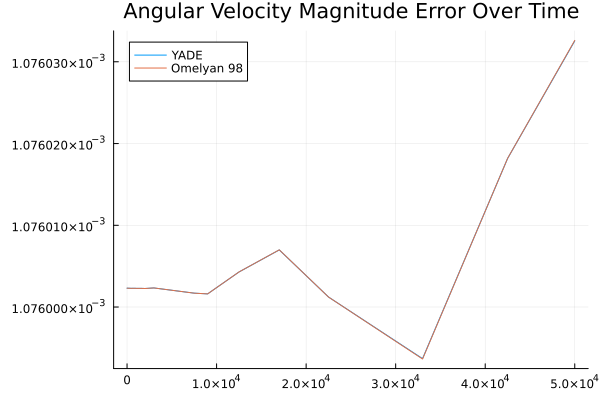

In [64]:
E1 = []
E2 = []
E3 = []

for i in eachindex(w_sol)
    push!(E1, norm(Yw_sol[i] - w_sol[i]))
    push!(E2, norm(O98w_sol[i] - w_sol[i]))
    push!(E3, norm(O99w_sol[i] - w_sol[i]))
end
    

plot(E1, label="YADE", title="Angular Velocity Magnitude Error Over Time")
plot!(E2, label="Omelyan 98")
#plot!(E3, label="Omelyan 99")

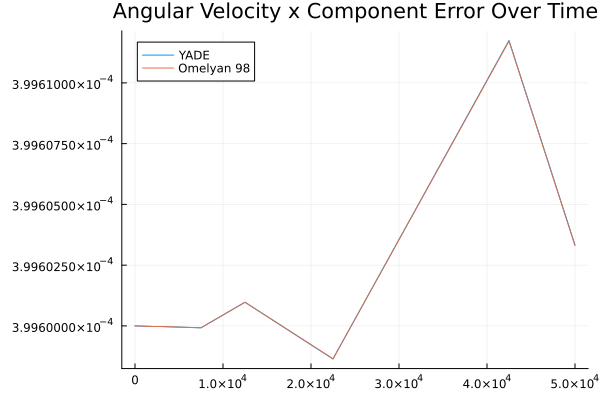

In [65]:
E1 = []
E2 = []
E3 = []

for i in eachindex(w_sol)
    push!(E1, abs(Yw_sol[i][1] - w_sol[i][1]))
    push!(E2, abs(O98w_sol[i][1] - w_sol[i][1]))
    push!(E3, abs(O99w_sol[i][1] - w_sol[i][1]))
end
    

plot(E1, label="YADE", title="Angular Velocity x Component Error Over Time")
plot!(E2, label="Omelyan 98")
#plot!(E3, label="Omelyan 99")

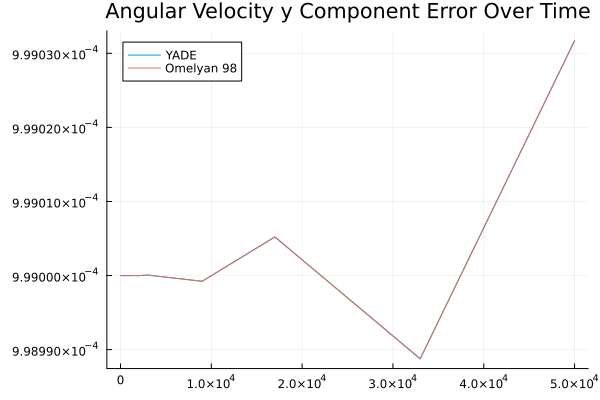

In [66]:
E1 = []
E2 = []
E3 = []

for i in eachindex(w_sol)
    push!(E1, abs(Yw_sol[i][2] - w_sol[i][2]))
    push!(E2, abs(O98w_sol[i][2] - w_sol[i][2]))
    push!(E3, abs(O99w_sol[i][2] - w_sol[i][2]))
end
    

plot(E1, label="YADE", title="Angular Velocity y Component Error Over Time")
plot!(E2, label="Omelyan 98")
#plot!(E3, label="Omelyan 99")

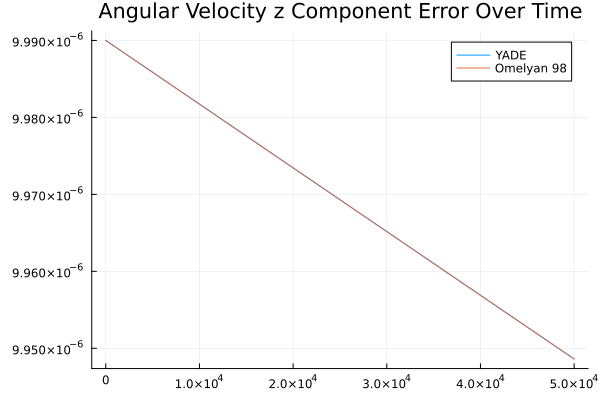

In [67]:
E1 = []
E2 = []
E3 = []

for i in eachindex(w_sol)
    push!(E1, abs(Yw_sol[i][3] - w_sol[i][3]))
    push!(E2, abs(O98w_sol[i][3] - w_sol[i][3]))
    push!(E3, abs(O99w_sol[i][3] - w_sol[i][3]))
end
    

plot(E1, label="YADE", title="Angular Velocity z Component Error Over Time")
plot!(E2, label="Omelyan 98")
#plot!(E3, label="Omelyan 99")

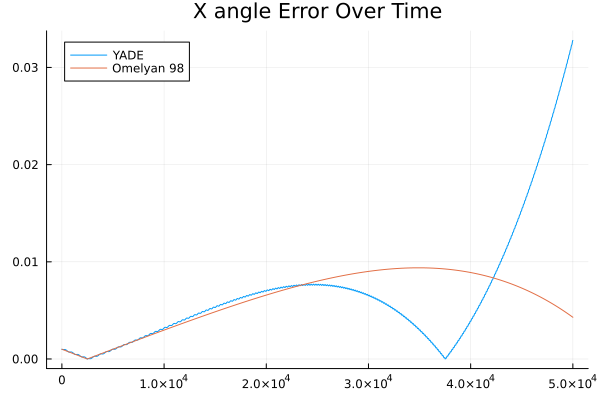

In [70]:
E1 = []
E2 = []
E3 = []

for i in eachindex(w_sol)
    push!(E1, abs(quat_to_angle(Yq_sol[i] ∘ inv(q_sol[i]), :XYZ).a1) )
    push!(E2, abs(quat_to_angle(O98q_sol[i] ∘ inv(q_sol[i]), :XYZ).a1) )
    push!(E3, abs(quat_to_angle(O99q_sol[i] ∘ inv(q_sol[i]), :XYZ).a1) )
end
    

plot(E1, label="YADE", title="X angle Error Over Time")
plot!(E2, label="Omelyan 98")
#plot!(E3, label="Omelyan 99")

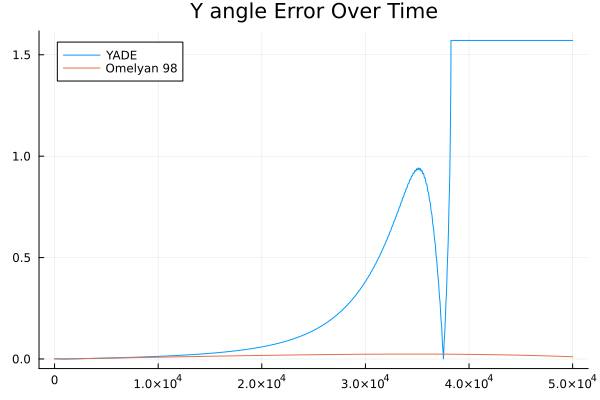

In [72]:
E1 = []
E2 = []
E3 = []

for i in eachindex(w_sol)
    push!(E1, abs(quat_to_angle(Yq_sol[i] ∘ inv(q_sol[i]), :XYZ).a2) )
    push!(E2, abs(quat_to_angle(O98q_sol[i] ∘ inv(q_sol[i]), :XYZ).a2) )
    push!(E3, abs(quat_to_angle(O99q_sol[i] ∘ inv(q_sol[i]), :XYZ).a2) )
end
    

plot(E1, label="YADE", title="Y angle Error Over Time")
plot!(E2, label="Omelyan 98")
#plot!(E3, label="Omelyan 99")

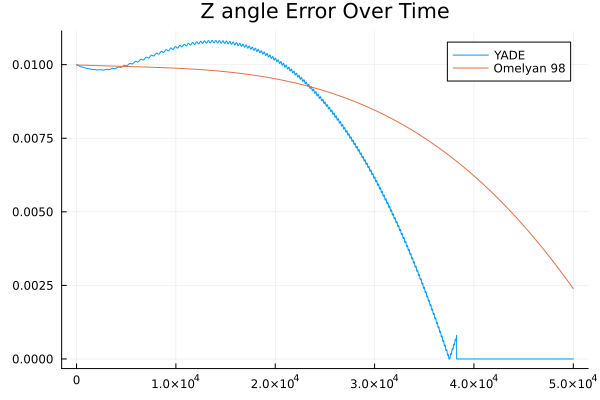

In [73]:
E1 = []
E2 = []
E3 = []

for i in eachindex(w_sol)
    push!(E1, abs(quat_to_angle(Yq_sol[i] ∘ inv(q_sol[i]), :XYZ).a3) )
    push!(E2, abs(quat_to_angle(O98q_sol[i] ∘ inv(q_sol[i]), :XYZ).a3) )
    push!(E3, abs(quat_to_angle(O99q_sol[i] ∘ inv(q_sol[i]), :XYZ).a3) )
end
    

plot(E1, label="YADE", title="Z angle Error Over Time")
plot!(E2, label="Omelyan 98")
#plot!(E3, label="Omelyan 99")